# $C^k$ - loss regularization

In this notebook we look at the remaining loss and overall curve shape when optimizing approximation and continuity error.  
$C^k$-discontinuity is measured in the loss function  

\
$\ell = \alpha \ell_2 + (1-\alpha) \ell_{CK}$,
\
by
\
$\ell_{CK} = \frac{1}{m - 1} \sum_{i=1}^{m-1} \sum_{j=0}^k \frac{\delta_{i,j}^2}{r_k}
  \quad \text{with} \quad
   \delta_{i,j} = p^{(j)}_{i+1}(\xi_i) - p^{(j)}_i(\xi_i),$

were $r_k$ is the derivative specific regularization factor (explained further down below in this notebook).  

In this notebook we ask:  
 - Is regularization needed for $\ell_{CK}$ of individual segments?  
 - In this combined optimization setting (where our loss function is considering 2 targets),   
 does adding $\ell_{CK}$ really lead to a lower continuity error than just having $\ell_2$?  
 - How does Chebyshev basis perform in comparison to Power basis?  
  
  
Version 3.0  
Date: 2024-01-18  
Current version: hannes.waclawek@fh-salzburg.ac.at  

# Take-aways from previous notebook

## Optimizer
We utilize the AMSGrad optimizer in this notebook, as it turned out to perform best in the previous notebook's experiments.  

## Character of $\ell_{CK}$
By adding $\ell_{CK}$, the loss landscape gets non-convex and we are prone of getting stuck at local optima  
(There is no unique solution for the overall spline to be continuous).  
This shows also in the form of spikes in the $C^k$-loss as seen in the previous notebook, were the optimizer  
"moves" away from a local optimum it converged towards, resulting for a seemingly visually nicely converged result to suddenly begin to oscillate and re-adjust.  
We counter this by applying early stopping and reverting to the best result achieved throughout the whole training process.  

## Epochs and early stopping
Based on results of the previous notebook, we perform experiments with 2000 epochs and early stopping with patience of 500 epochs.  

____________

# Findings of this notebook

## Alpha / Curve shape / oscillating behaviour

Chebyshev basis outperforms Power basis with respect to overall curve shape and remianing losses throughout all applied alphas.  
The effect gets milder with increased variance / noise in the data.  
Chebyshev basis shows less oscillating behaviour with low variance data when compared to Power basis.  

## $C^k$-loss regularization vs. no $C^k$-loss regularization

Without $C^k$-loss regularization, oscillating behaviour can be observed with both bases and all observed input data.  
The effect is stronger for Chebyshev basis.  
With regularization in place, clearly lower remaining losses are achieved in all conducted experiments and curve shapes are considerably improved.  
Again, with high variance / noisy data the effects are the mildest.  

## $C^k$-optimization vs. no $C^k$-optimization

The results with $C^k$-optimization outperform the results without $C^k$-optimization with all observed input data with respect to remaining total loss.  
Contrary to the other experiments performed in this notebook, as expected, the effect is stronger with more variance in the input data,  
as discontinuities at boundary points tend to be higher.  

## Increasing number of polynomial segments

If we increase the number of segments, the variance in the individual segments input data is tendentially decreased and lower remaining losses are achieved.  
With rising variance / noise in the input data, the effect gets milder.  
One has to make sure, however, that the number of points within a segment are still sufficiently high.  
We have also seen in other experiments that $l_{CK}$-optimization can, however, to some extent,   
help in fitting point clouds otherwise leading to an underdetermined setting/poor fit for the specific polynomial degree.  

In [17]:
# Imports
import math
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import multiprocessing as mp
from itertools import repeat

from tfspline import model, parallel, plot, sampledata

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
learning_rate = 0.1
shift_polynomial_centers = 'mean' # Power and Chebyshev Basis
shift_polynomial_centers_sc = 'boundary' # Shifted Chebyshev Basis
ck = 3
degree = 7

colors = list(mcolors.TABLEAU_COLORS.keys())

## Data

Text(0.5, 1.0, 'Scaled to range [0, 2] for 2 polynomial segments')

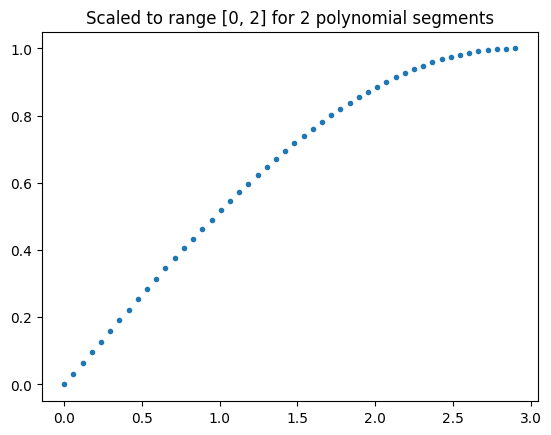

In [20]:
# The data set to approximate with x and y samples
xs2_ori = np.linspace(0, 0.5*np.pi, 50)
ys2 = np.sin(xs2_ori)
#plt.plot(xs2_ori, ys2, '.')
xs2 = sampledata.rescale_input_data(xs2_ori, 2.9)
plt.plot(xs2, ys2, '.')
plt.title('Scaled to range [0, 2] for 2 polynomial segments')

Text(0.5, 1.0, 'Scaled to range [0, 4] for 4 polynomial segments')

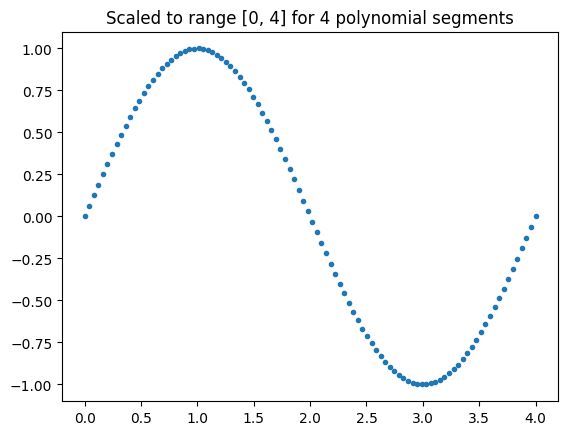

In [21]:
xsin = np.linspace(0, 2*np.pi, 100)
ysin = np.sin(xsin)
xsin = sampledata.rescale_input_data(xsin, 4)

plt.plot(xsin, ysin, '.')
plt.title('Scaled to range [0, 4] for 4 polynomial segments')

Text(0.5, 1.0, 'Scaled to range [0, 10] for 10 polynomial segments')

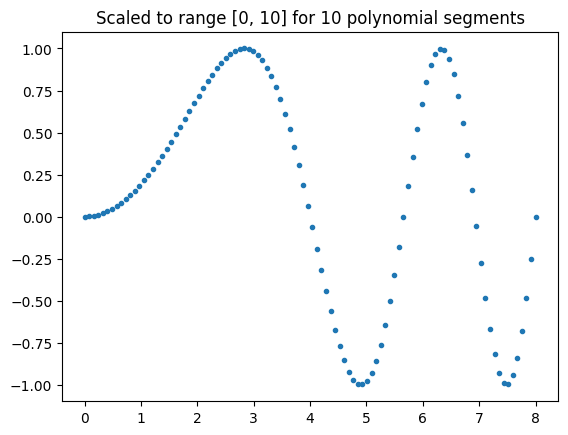

In [22]:
xsinvar = np.linspace(0, 1, 100)
ysinvar = np.sin(xsinvar**2 * 4 * np.pi)
xsinvar = sampledata.rescale_input_data(xsinvar, 8)

plt.plot(xsinvar, ysinvar, '.')
plt.title('Scaled to range [0, 10] for 10 polynomial segments')

Text(0.5, 1.0, 'Scaled to range [0, 2] for 2 polynomial segments')

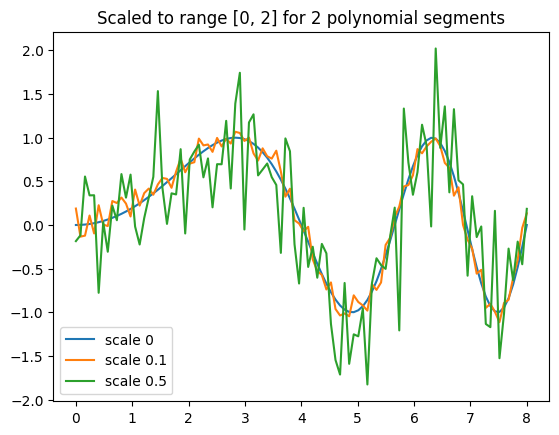

In [23]:
# Explicit seed to have reproducible testsets
np.random.seed(0)
ys2gauss_scales = [0.0, 0.1, 0.5]
ys2gauss = [ysinvar + np.random.normal(scale=s, size=len(ysinvar)) for s in ys2gauss_scales]

for i, ysn in enumerate(ys2gauss):
    plt.plot(xsinvar, ysn, '-', label='scale %.2g' % ys2gauss_scales[i])
plt.legend(loc="best")
plt.title('Scaled to range [0, 2] for 2 polynomial segments')

In [24]:
def plot_ck_regularization_modes_results(data_x, data_y, lambdas=[0.9], bases=['power', 'chebyshev'], epochs=500, polynum=2, degree=7, title=''):
    args = [(b, l) for b in bases for l in lambdas]
    
    kwargs = {'data_x': data_x, 'data_y': data_y, 'polynum': polynum, 'ck': ck, 'continuity': False,
            'optimizer': 'AMSGrad', 'n_epochs': epochs, 'degree': degree, 
            'basis': 'chebyshev', 'mode': 'lambda_and_basis', 'initialization': 'zero', 'early_stopping': True, 'patience': 500}
    
    pool = mp.Pool(mp.cpu_count())
    results = pool.starmap(parallel.job, zip(args, repeat(kwargs)))
    results = [results[i:i+len(lambdas)] for i in range(0, len(results), len(lambdas))]
    
    fig, axes = plt.subplots(ck+2, 2)
    fig.set_figwidth(14)
    fig.set_figheight((ck+2)*6)
    fig.suptitle(title)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    for i in range(0, len(lambdas)):
        lambd= results[0][i][0]["param_value"][1]
        spline_power = model.get_spline_from_coeffs(results[0][i][-1], data_x, data_y, basis='power', ck=ck, total_loss_values=results[0][i][1], e_loss_values=results[0][i][2], d_loss_values=results[0][i][4], D_loss_values=results[0][i][3])
        spline_chebyshev = model.get_spline_from_coeffs(results[1][i][-1], data_x, data_y, basis='chebyshev', ck=ck, total_loss_values=results[1][i][1], e_loss_values=results[1][i][2], d_loss_values=results[1][i][4], D_loss_values=results[1][i][3])
        for j in range(0, ck+1):
            plot.plot_spline(spline_power, ax=axes[j][0], label=f'with l_ck regularization (alpha={lambd}): {spline_power.total_loss_values[-1]}', segment_coloring=False, color=colors[i], deriv=j)
            plot.plot_spline(spline_chebyshev, ax=axes[j][1], label=f'with l_ck regularization (alpha={lambd}): {spline_chebyshev.total_loss_values[-1]}', segment_coloring=False, color=colors[i], deriv=j)    
        
        plot.plot_loss(spline_power, ax=axes[-1][0], label=f'with l_ck regularization (alpha={lambd}): {spline_power.total_loss_values[-1]}', color=colors[i])
        plot.plot_loss(spline_chebyshev, ax=axes[-1][1], label=f'with l_ck regularization (alpha={lambd}) {spline_chebyshev.total_loss_values[-1]}', color=colors[i])
       
    for i in range(0, ck+1):
        axes[i][0].set_title(f'Power Basis - Degree {degree} - C^{ck} - Derivative {i}')
        axes[i][0].legend(loc="best")
        axes[i][1].set_title(f'Chebyshev Basis - Degree {degree} - C^{ck}- Derivative {i}')
        axes[i][1].legend(loc="best")
    
    axes[-1][0].set_title(f'Power Basis - Degree {degree} - Total Loss')
    axes[-1][0].legend(loc="best")
    axes[-1][1].set_title(f'Chebyshev Basis - Degree {degree} - Total Loss')
    axes[-1][1].legend(loc="best")
    
    return fig

In [25]:
def plot_ck_regularization_optimal_modes_results(data_x, data_y, lambd=0.5, epochs=500, polynum=2, degree=7, plot_without_regularization=False, plot_without_ck_optimization=True, early_stopping=True, patience=500, initialization='zero', title=''):
    spline_with = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='power', shift_polynomial_centers=shift_polynomial_centers)
    opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
    spline_with.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1-lambd, factor_ck_pressure=lambd, ck_regularization=True, early_stopping=early_stopping, patience=patience, initialization=initialization)
        
    if plot_without_regularization:
        spline_without_reg = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='power', shift_polynomial_centers=shift_polynomial_centers)
        opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
        spline_without_reg.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1-lambd, factor_ck_pressure=lambd, ck_regularization=False, early_stopping=early_stopping, patience=patience, initialization=initialization)
    
    if plot_without_ck_optimization:
        spline_without = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='power', shift_polynomial_centers=shift_polynomial_centers)
        opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
        spline_without.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1, factor_ck_pressure=0, ck_regularization=False, early_stopping=early_stopping, patience=patience, initialization=initialization)
    
    spline_chebyshev_with = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='chebyshev', shift_polynomial_centers=shift_polynomial_centers)
    opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
    spline_chebyshev_with.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1-lambd, factor_ck_pressure=lambd, ck_regularization=True, early_stopping=early_stopping, patience=patience, initialization=initialization)
    
    if plot_without_regularization:
        spline_chebyshev_without_reg = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='chebyshev', shift_polynomial_centers=shift_polynomial_centers)
        opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
        spline_chebyshev_without_reg.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1-lambd, factor_ck_pressure=lambd, ck_regularization=False, patience=patience, early_stopping=early_stopping, initialization=initialization)

    if plot_without_ck_optimization:
        spline_chebyshev_without = model.Spline(polydegree=degree, polynum=polynum, ck=ck, basis='chebyshev', shift_polynomial_centers=shift_polynomial_centers)
        opt = keras.optimizers.Adam(amsgrad=True, learning_rate=learning_rate)
        spline_chebyshev_without.fit(data_x, data_y, optimizer=opt, n_epochs=epochs, factor_approximation_quality=1, factor_ck_pressure=0, ck_regularization=False, early_stopping=early_stopping, patience=patience, initialization=initialization)

    fig, axes = plt.subplots(ck+2, 2)
    fig.set_figwidth(14)
    fig.set_figheight((ck+2)*6)
    fig.suptitle(title)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    for i in range(0, ck+1):
        plot.plot_spline(spline_with, ax=axes[i][0], label=f'with l_ck regularization (alpha: {lambd}): {spline_with.total_loss_values[-1]}', segment_coloring=False, color=colors[3], deriv=i)
        if plot_without_ck_optimization:
            plot.plot_spline(spline_without, ax=axes[i][0], label=f'without l_ck optimization: {spline_without.total_loss_values[-1]}', segment_coloring=False, color=colors[2], deriv=i)
        if plot_without_regularization:
            plot.plot_spline(spline_without_reg, ax=axes[i][0], label=f'without l_ck regularization: {spline_without_reg.total_loss_values[-1]}', segment_coloring=False, color=colors[2], deriv=i)
        plot.plot_spline(spline_chebyshev_with, ax=axes[i][1], label=f'with l_ck regularization (alpha: {lambd}): {spline_chebyshev_with.total_loss_values[-1]}', segment_coloring=False, color=colors[3], deriv=i)
        if plot_without_ck_optimization:
            plot.plot_spline(spline_chebyshev_without, ax=axes[i][1], label=f'without l_ck optimization: {spline_chebyshev_without.total_loss_values[-1]}', segment_coloring=False, color=colors[2], deriv=i)
        if plot_without_regularization:
            plot.plot_spline(spline_chebyshev_without_reg, ax=axes[i][1], label=f'without l_ck regularization: {spline_chebyshev_without_reg.total_loss_values[-1]}', segment_coloring=False, color=colors[2], deriv=i)
        axes[i][0].set_title(f'Power Basis - Degree {degree} - C^{ck} - Derivative {i}')
        axes[i][0].legend(loc="best")
        axes[i][1].set_title(f'Chebyshev Basis - Degree {degree} - C^{ck} - Derivative {i}')
        axes[i][1].legend(loc="best")
    
    plot.plot_loss(spline_with, ax=axes[-1][0], label=f'with l_ck regularization (alpha: {lambd}): {spline_with.total_loss_values[-1]}', color=colors[3])
    if plot_without_regularization:
        plot.plot_loss(spline_without_reg, ax=axes[-1][0], label=f'without l_ck regularization: {spline_without_reg.total_loss_values[-1]}', color=colors[2])
    if plot_without_ck_optimization:
        plot.plot_loss(spline_without, ax=axes[-1][0], label=f'without l_ck optimization: {spline_without.total_loss_values[-1]}', color=colors[2])
    plot.plot_loss(spline_chebyshev_with, ax=axes[-1][1], label=f'with l_ck regularization (alpha: {lambd}): {spline_chebyshev_with.total_loss_values[-1]}', color=colors[3])
    if plot_without_regularization:
        plot.plot_loss(spline_chebyshev_without_reg, ax=axes[-1][1], label=f'without l_ck regularization: {spline_chebyshev_without_reg.total_loss_values[-1]}', color=colors[2])
    if plot_without_ck_optimization:
        plot.plot_loss(spline_chebyshev_without, ax=axes[-1][1], label=f'without l_ck optimization: {spline_chebyshev_without.total_loss_values[-1]}', color=colors[2])
    axes[-1][0].set_title(f'Power Basis - Degree {degree} - C^{ck} - Total Loss')
    axes[-1][0].legend(loc="best")
    axes[-1][1].set_title(f'Chebyshev Basis - Degree {degree} - C^{ck} - Total Loss')
    axes[-1][1].legend(loc="best")
        
    return fig

In [26]:
# By sthu: stefan.huber@fh-salzburg.ac.at
def powerbasis(n):
    return np.poly1d([1, 0])**n

def chebychev(n):
    if n == 0:
        return np.poly1d([1])
    elif n == 1:        
        return np.poly1d([1, 0])
    else:
        return 2*chebychev(1)*chebychev(n-1) - chebychev(n-2)

## Regularization

The highest contributing factor to a derivative is the one of the highest order term.
Our approach is to regularize each derivative by this term.

In [27]:
max_degree = 8
max_deriv = 4
deriv = [[(chebychev(d).deriv(k)(1.0), powerbasis(d).deriv(k)(1.0))
              for d in range(max_degree+1)]
              for k in range(max_deriv+1)]

df = pd.DataFrame(deriv, columns=list(range(max_degree+1)))
df.style.set_caption("k-th derivative of n-th polynomial at position 1.0 with with k≤{} and n≤{}. Entries are pairs (chebyshev, power basis)".format(max_deriv, max_degree))
df

,0,1,2,3,4,5,6,7,8
0,"(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)","(1.0, 1.0)"
1,"(0.0, 0.0)","(1.0, 1.0)","(4.0, 2.0)","(9.0, 3.0)","(16.0, 4.0)","(25.0, 5.0)","(36.0, 6.0)","(49.0, 7.0)","(64.0, 8.0)"
2,"(0.0, 0.0)","(0.0, 0.0)","(4.0, 2.0)","(24.0, 6.0)","(80.0, 12.0)","(200.0, 20.0)","(420.0, 30.0)","(784.0, 42.0)","(1344.0, 56.0)"
3,"(0.0, 0.0)","(0.0, 0.0)","(0.0, 0.0)","(24.0, 6.0)","(192.0, 24.0)","(840.0, 60.0)","(2688.0, 120.0)","(7056.0, 210.0)","(16128.0, 336.0)"
4,"(0.0, 0.0)","(0.0, 0.0)","(0.0, 0.0)","(0.0, 0.0)","(192.0, 24.0)","(1920.0, 120.0)","(10368.0, 360.0)","(40320.0, 840.0)","(126720.0, 1680.0)"


For Power basis, we have the closed formula for this factor

$\frac{d!}{(d-k)!}$, where $d$ is the term order and $k$ is the derivative.

In [28]:
[math.factorial(6)/math.factorial(6-k) for k in range(6)]

[1.0, 6.0, 30.0, 120.0, 360.0, 720.0]

We are only interested in the values at the boundaries of the interval for establishing $C^k$-continuity.
We operate both Power and Chebyshev basis in the interval [-1, 1]. Due to symmetry properties, we therefore 
receive the same abs values at both ends of the interval.

We therefore don't need a closed formula also for Chebyshev, but can simply evaluate $T_n(1)$ for the n-th derivative.

In [29]:
degree = 7
spline = model.Spline(polydegree=degree, polynum=2, ck=2, basis='chebyshev')
spline.fit(xs2, ys2, n_epochs=1)

[spline.chebyshev_polynomials[degree][k](1) for k in range(degree)]

[1, 49, 784, 7056, 40320, 147840, 322560]

In [32]:
degree = 7
spline = model.Spline(polydegree=degree, polynum=2, ck=2, basis='chebyshev')
spline.fit(xs2, ys2, n_epochs=1)

[spline.chebyshev_polynomials[degree][k](-1) for k in range(degree)]

[-1, 49, -784, 7056, -40320, 147840, -322560]

**However, experiments show that $\frac{d!}{(d-k)!}$ works clearly better also for Chebyshev basis, so we go with this factor for both bases.**

# Parameters

In [33]:
epochs = 2000
degree = 7
ck=3

# Test different alphas

In [34]:
alphas3 = [0.990, 0.9990, 0.99990, 0.999990, 0.9999990]
alphas2 = [0.5, 0.6, 0.7, 0.8, 0.9]
alphas = [0.3, 0.2, 0.1, 0.05, 0.001]
polynum=2

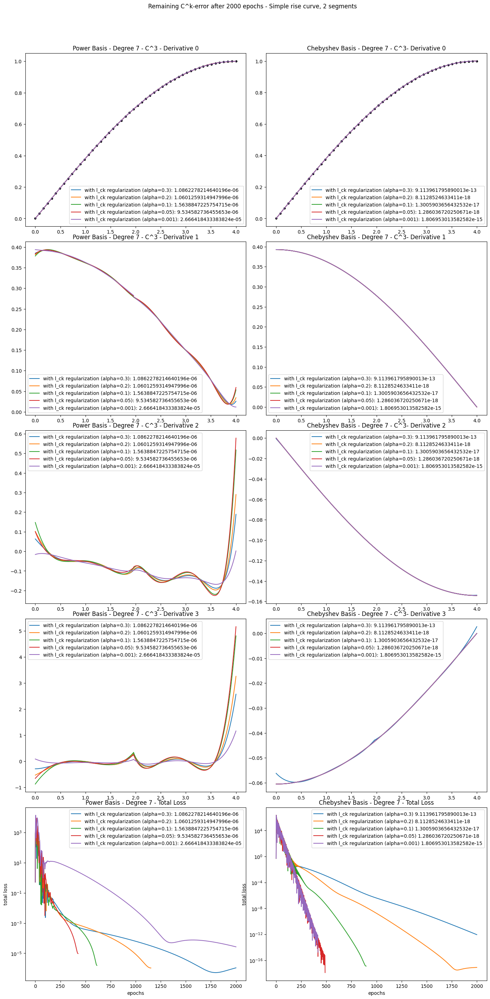

In [35]:
fig1 = plot_ck_regularization_modes_results(xs2, ys2, alphas, epochs=epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Simple rise curve, {polynum} segments')

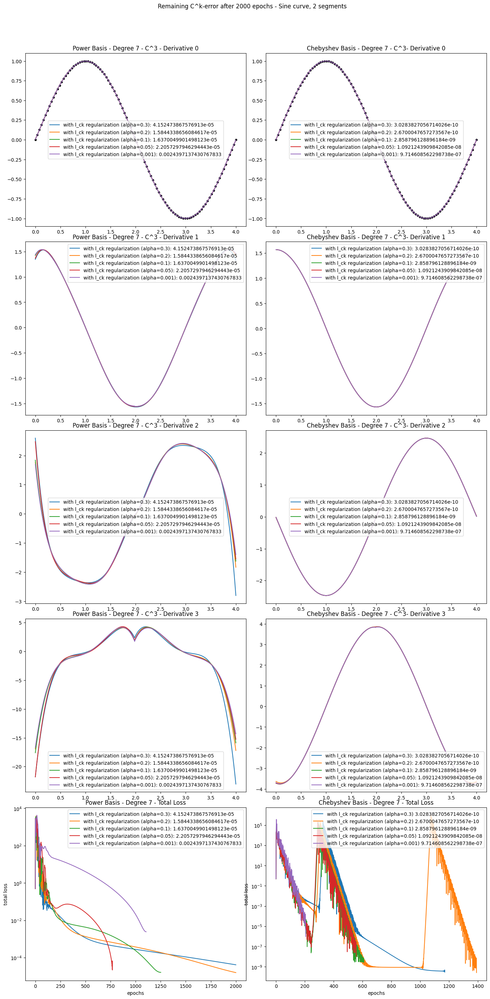

In [36]:
fig2 = plot_ck_regularization_modes_results(xsin, ysin, alphas, epochs=epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve, {polynum} segments')

In [37]:
polynum=3

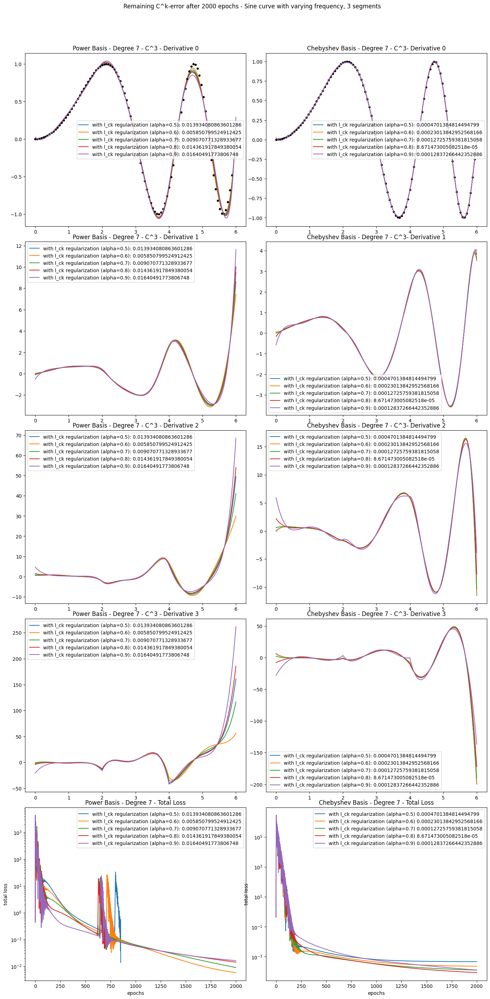

In [38]:
fig3 = plot_ck_regularization_modes_results(xsinvar, ysinvar, alphas2, epochs=epochs, polynum=3, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve with varying frequency, {polynum} segments')

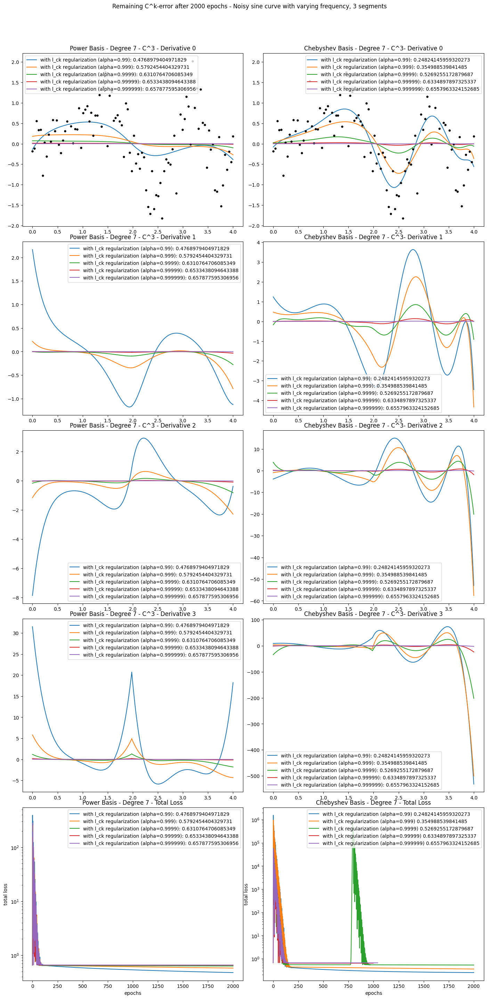

In [39]:
fig4 = plot_ck_regularization_modes_results(xsinvar, ys2gauss[2], alphas3, epochs=epochs, polynum=2, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Noisy sine curve with varying frequency, {polynum} segments')

### Interpretation

Chebyshev basis outperforms Power basis with respect to overall curve shape and remianing losses throughout all applied alphas.
The effect gets milder with increased variance / noise in the data.
Chebyshev basis shows less oscillating behaviour with low variance data when compared to Power basis.

# $C^k$-loss regularization vs. no $C^k$-loss regularization
Lets now compare the most favourable regularization method and degree of each basis against no regularization.

In [40]:
lambd3 = 0.9990
lambd2 = 0.8
lambd = 0.1

In [41]:
polynum=2

Early stop: Achieved best result after 613 epochs. Exiting.
Early stop: Achieved best result after 896 epochs. Exiting.


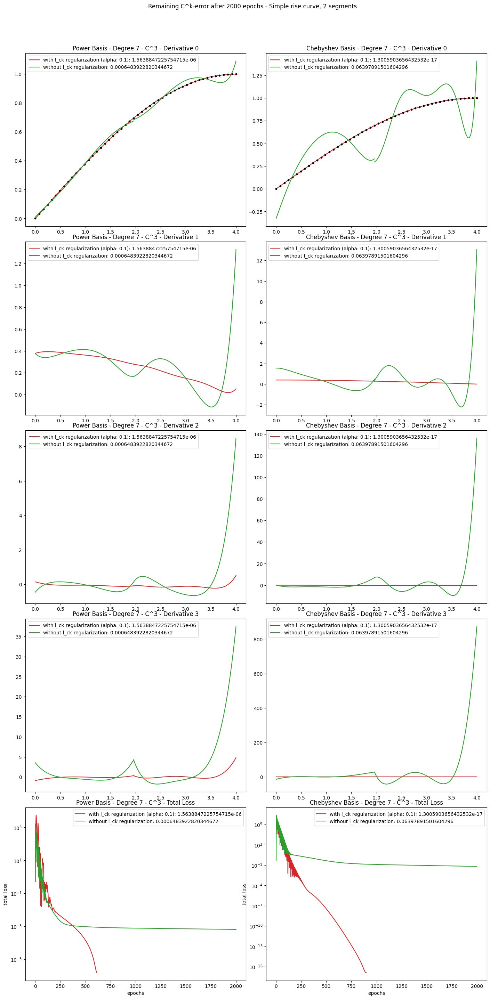

In [42]:
fig1 = plot_ck_regularization_optimal_modes_results(xs2, ys2, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Simple rise curve, {polynum} segments', plot_without_regularization=True, plot_without_ck_optimization=False)

Early stop: Achieved best result after 1250 epochs. Exiting.
Early stop: Achieved best result after 608 epochs. Exiting.


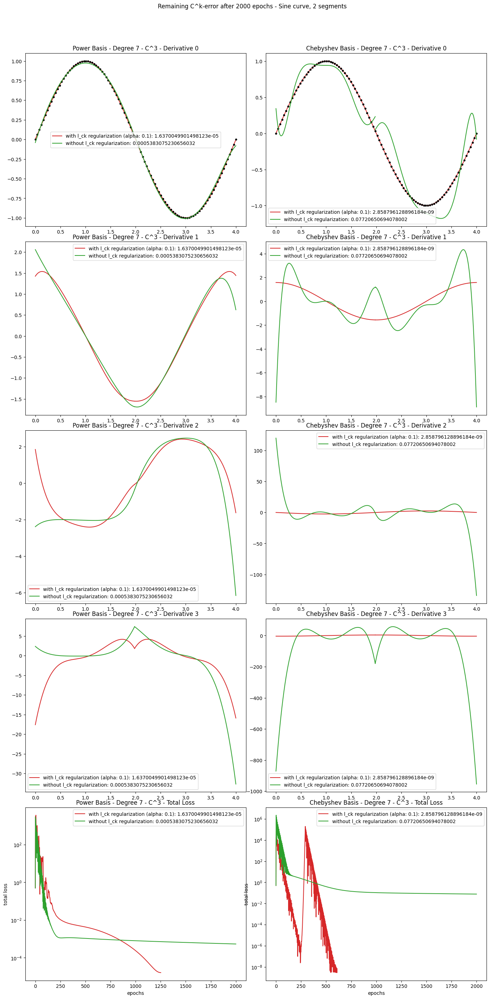

In [43]:
fig2 = plot_ck_regularization_optimal_modes_results(xsin, ysin, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve, {polynum} segments', plot_without_regularization=True, plot_without_ck_optimization=False)

In [44]:
polynum=3

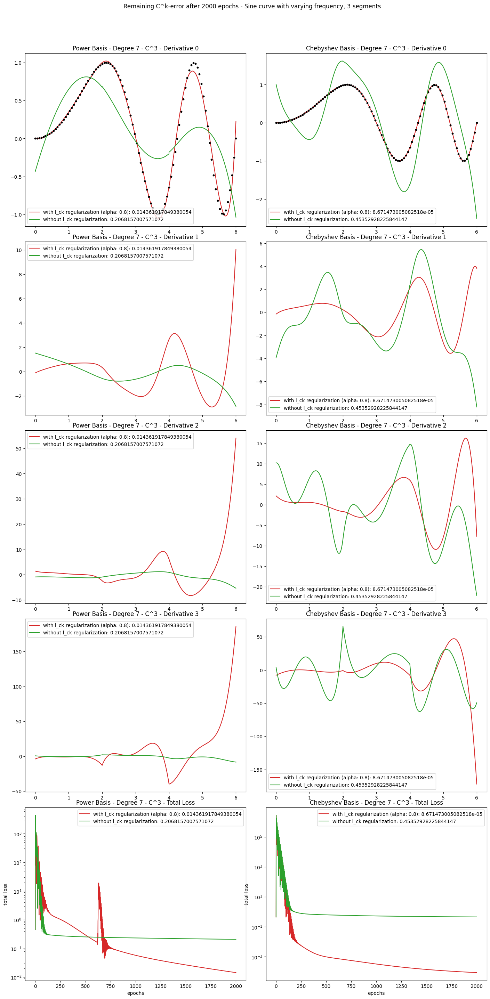

In [45]:
fig3 = plot_ck_regularization_optimal_modes_results(xsinvar, ysinvar, lambd2, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve with varying frequency, {polynum} segments', plot_without_regularization=True, plot_without_ck_optimization=False)

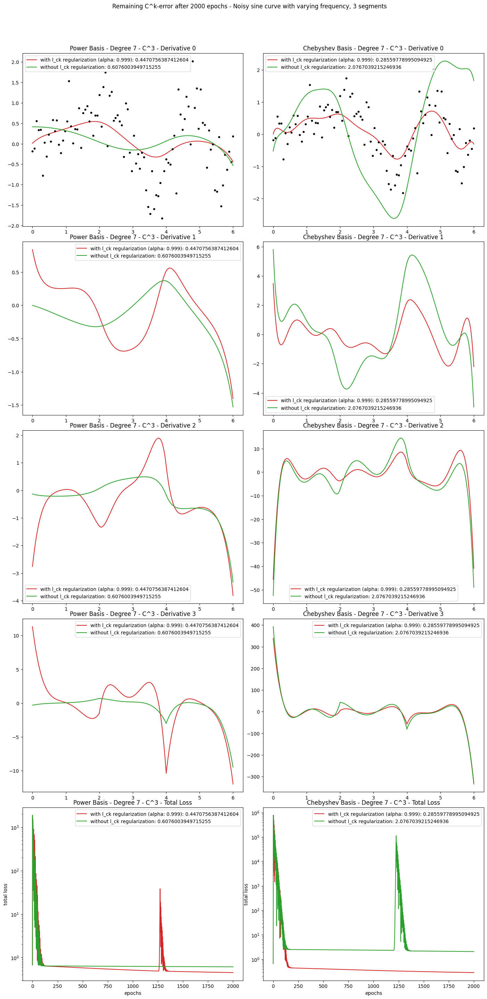

In [46]:
fig4 = plot_ck_regularization_optimal_modes_results(xsinvar, ys2gauss[2], lambd3, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Noisy sine curve with varying frequency, {polynum} segments', plot_without_regularization=True, plot_without_ck_optimization=False)

### Interpretation
Without $C^k$-loss regularization, oscillating behaviour can be observed with both bases and all observed input data.
The effect is stronger for Chebyshev basis.
With regularization in place, clearly lower remaining losses are achieved in all conducted experiments and curve shapes are considerably improved.
Again, with high variance / noisy data the effects are the mildest.

# $C^k$-optimization vs. no $C^k$-optimization

In [47]:
polynum=2

Early stop: Achieved best result after 613 epochs. Exiting.
Early stop: Achieved best result after 143 epochs. Exiting.
Early stop: Achieved best result after 896 epochs. Exiting.
Early stop: Achieved best result after 758 epochs. Exiting.


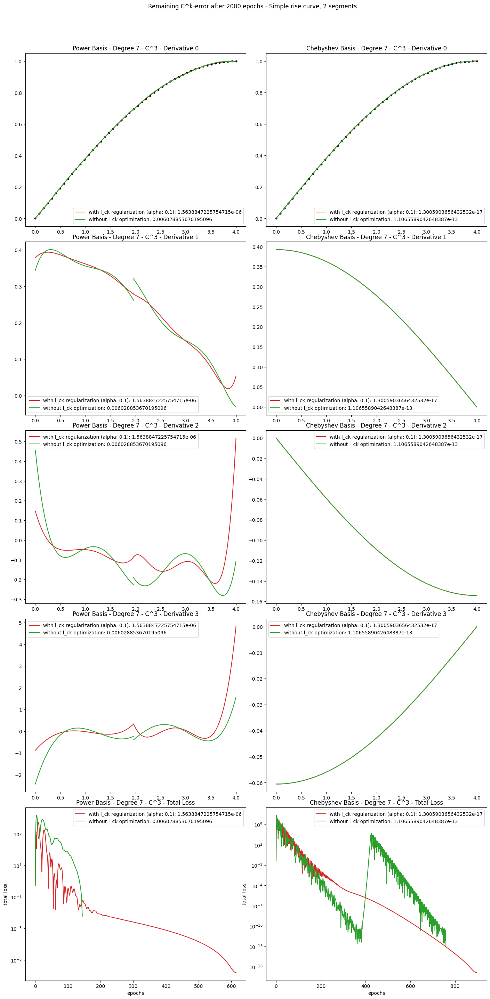

In [48]:
fig1 = plot_ck_regularization_optimal_modes_results(xs2, ys2, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Simple rise curve, {polynum} segments')

Early stop: Achieved best result after 1250 epochs. Exiting.
Early stop: Achieved best result after 608 epochs. Exiting.
Early stop: Achieved best result after 176 epochs. Exiting.


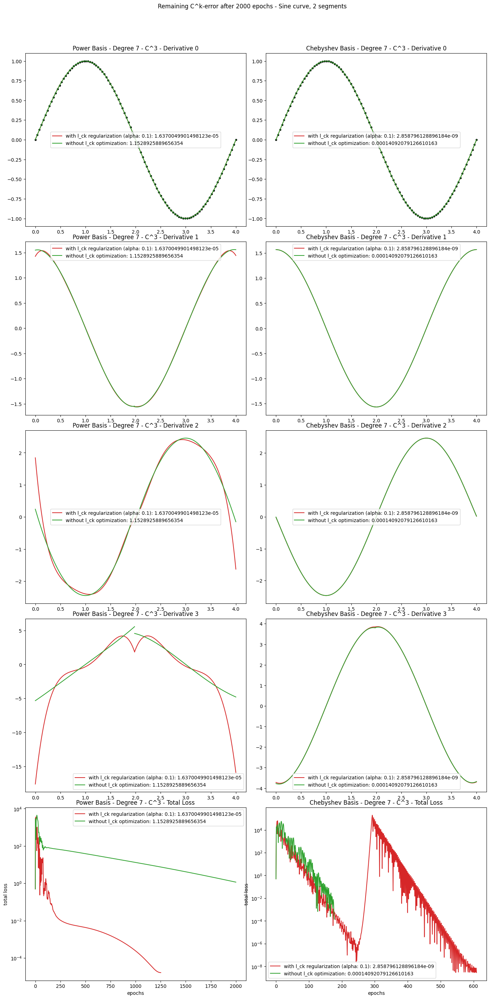

In [49]:
fig2 = plot_ck_regularization_optimal_modes_results(xsin, ysin, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve, {polynum} segments')

In [50]:
polynum=3

Early stop: Achieved best result after 1 epochs. Exiting.
Early stop: Achieved best result after 50 epochs. Exiting.


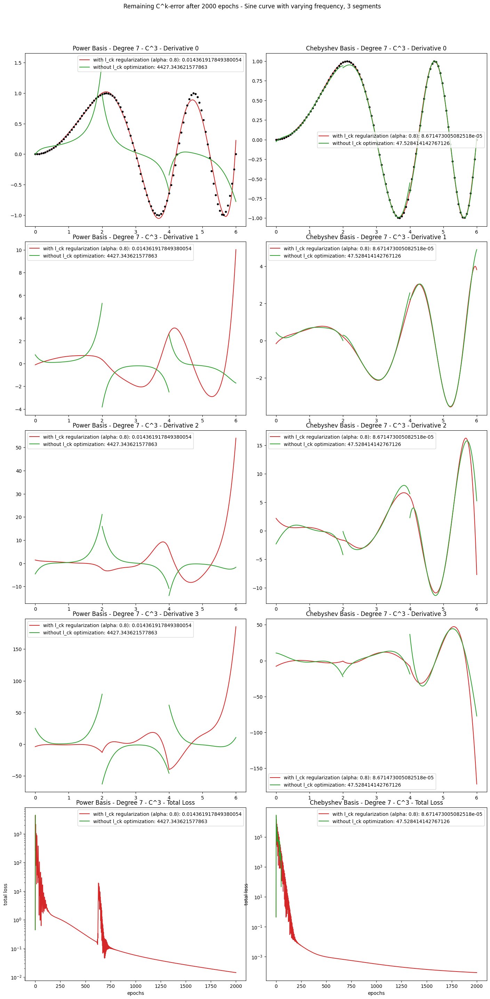

In [51]:
fig3 = plot_ck_regularization_optimal_modes_results(xsinvar, ysinvar, lambd2, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve with varying frequency, {polynum} segments')

Early stop: Achieved best result after 21 epochs. Exiting.
Early stop: Achieved best result after 13 epochs. Exiting.


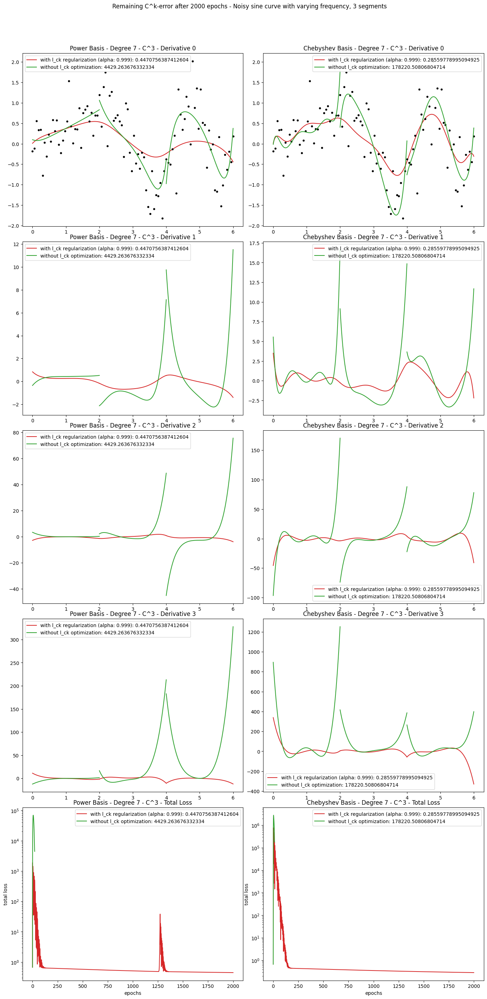

In [52]:
fig4 = plot_ck_regularization_optimal_modes_results(xsinvar, ys2gauss[2], lambd3, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Noisy sine curve with varying frequency, {polynum} segments')

### Interpretation

The results with $C^k$-optimization outperform the results without $C^k$-optimization with all observed input data with respect to remaining $C^k$-loss.
Contrary to the other experiments performed in this notebook, as expected, the effect is stronger with more variance in the input data,
as discontinuities at boundary points tend to be higher.

## More segments

In [53]:
polynum=4

Early stop: Achieved best result after 683 epochs. Exiting.
Early stop: Achieved best result after 155 epochs. Exiting.
Early stop: Achieved best result after 555 epochs. Exiting.
Early stop: Achieved best result after 489 epochs. Exiting.


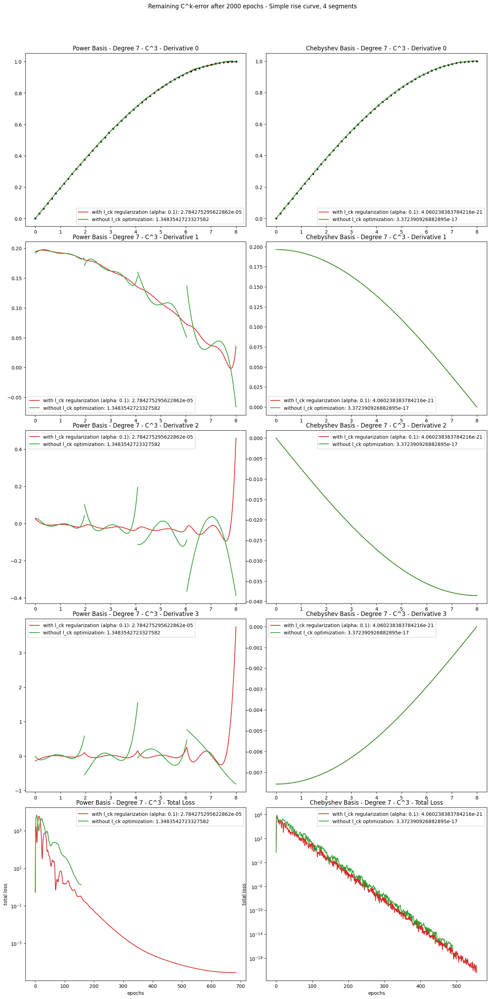

In [54]:
fig1 = plot_ck_regularization_optimal_modes_results(xs2, ys2, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Simple rise curve, {polynum} segments')

Early stop: Achieved best result after 462 epochs. Exiting.
Early stop: Achieved best result after 144 epochs. Exiting.
Early stop: Achieved best result after 846 epochs. Exiting.
Early stop: Achieved best result after 251 epochs. Exiting.


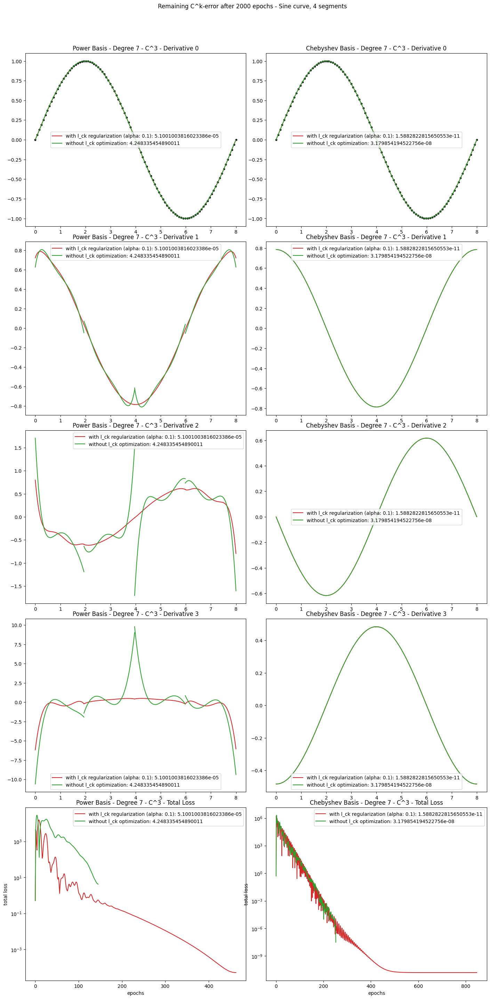

In [55]:
fig2 = plot_ck_regularization_optimal_modes_results(xsin, ysin, lambd, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve, {polynum} segments')

In [56]:
polynum=6

Early stop: Achieved best result after 188 epochs. Exiting.
Early stop: Achieved best result after 251 epochs. Exiting.


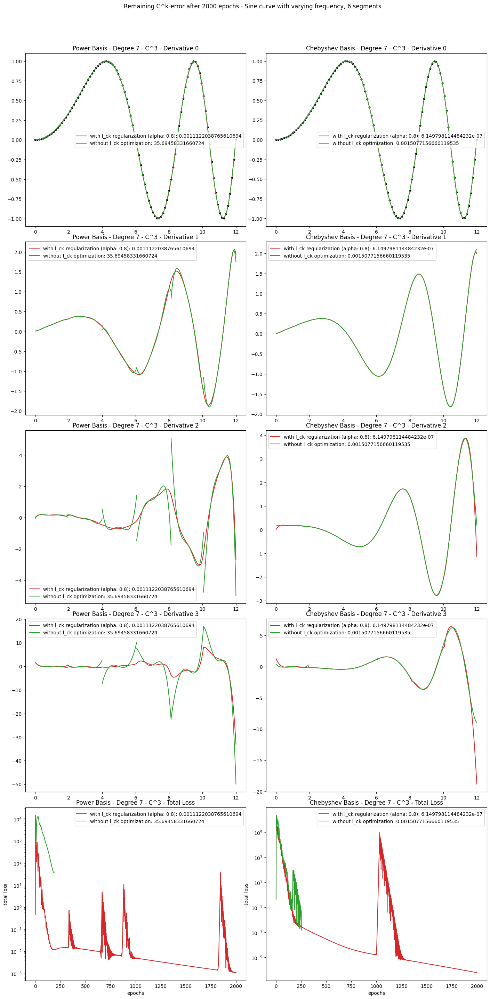

In [57]:
fig3 = plot_ck_regularization_optimal_modes_results(xsinvar, ysinvar, lambd2, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Sine curve with varying frequency, {polynum} segments')

Early stop: Achieved best result after 12 epochs. Exiting.
Early stop: Achieved best result after 1 epochs. Exiting.


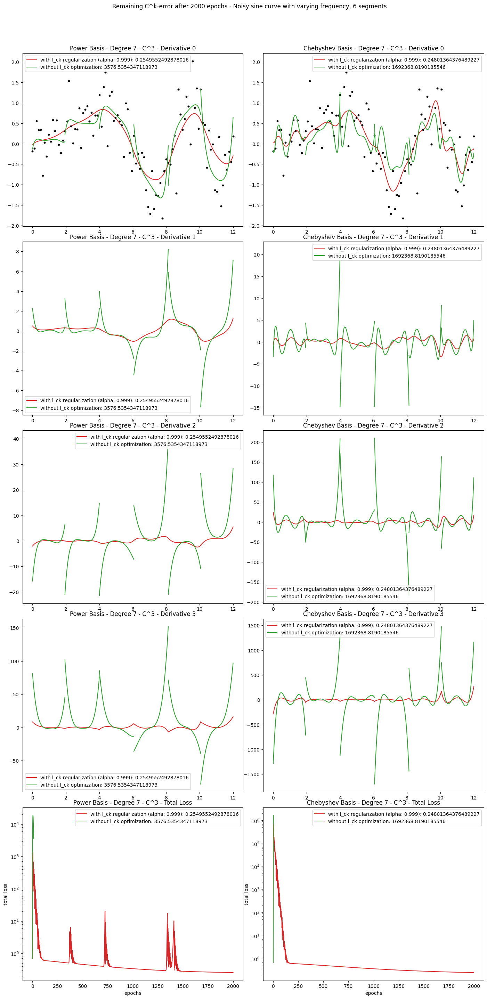

In [58]:
fig4 = plot_ck_regularization_optimal_modes_results(xsinvar, ys2gauss[2], lambd3, epochs, polynum=polynum, degree=degree, title=f'Remaining C^k-error after {epochs} epochs - Noisy sine curve with varying frequency, {polynum} segments')

### Interpretation

If we increase the number of segments, the variance in the individual segments input data is tendentially decreased and lower remaining losses are achieved.
With rising variance / noise in the input data, the effect gets milder.
One has to make sure, however, that the number of points within a segment are still sufficiently high.
We have also seen in other experiments that $l_{CK}$-optimization can, however, to some extent, help in fitting point clouds otherwise leading to an underdetermined setting/poor fit for the specific polynomial degree.